<a href="https://colab.research.google.com/github/faisu6339-glitch/Real_World-Projects/blob/main/Cassava(MobileNet%20Final).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
dataset_path = '/content/dataset_sir'

In [ ]:
!pip install -q tensorflow pandas scikit-learn matplotlib

import os
import json
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt

from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.applications import MobileNetV3Small
from tensorflow.keras.applications.mobilenet_v3 import preprocess_input
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, BatchNormalization
from tensorflow.keras.models import Model

print("TensorFlow:", tf.__version__)

TensorFlow: 2.20.0


### Error: File Not Found

The `FileNotFoundError` indicates that the path specified for your dataset (`/content/drive/MyDrive/dataset_sir/main_dataset`) does not exist or is incorrect. This often happens if the folder names or structure in your Google Drive do not exactly match the path defined in the notebook.

Please verify the exact path to your `main_dataset` folder in your Google Drive. You can use the cell below to list the contents of your `/content/drive/MyDrive` folder to help you locate it.

Once you find the correct path, you will need to update the `dataset_path` variable in cell `ZWCTg7NqPRm9` and the `BASE_PATH` variable in cell `T1VXQRz-RR6i`.

In [ ]:
print("Contents of /content/drive/MyDrive:")
!ls -F "/content/drive/MyDrive/"

Contents of /content/drive/MyDrive:
'Colab Notebooks'/	   'Untitled form.gform'
 dataset_sir/		   'Untitled project.gscript'
 file.pdf		   'Untitled spreadsheet (1).gsheet'
 main_dataset.zip	   'Untitled spreadsheet (2).gsheet'
 Products.gsheet	   'Untitled spreadsheet (3).gsheet'
 Products.pdf		   'Untitled spreadsheet.gsheet'
'Untitled form (1).gform'


In [ ]:
print("Contents of /content/:")
!ls -F "/content/"

Contents of /content/:
best_model.keras  dataset_sir/	drive/	sample_data/


In [ ]:
import pandas as pd

In [ ]:
BASE_PATH = '/content/dataset_sir/main_dataset'

TRAIN_CSV = BASE_PATH + "/Train/Train.csv"
TRAIN_DIR = BASE_PATH + "/Train/Train_Images"

TEST_CSV = BASE_PATH + "/Test/Test.csv"
TEST_DIR = BASE_PATH + "/Test/Test_images"

LABEL_JSON = BASE_PATH + "/label_num_to_disease_map.json"

In [ ]:
train_df = pd.read_csv(TRAIN_CSV)
test_df = pd.read_csv(TEST_CSV)

with open(LABEL_JSON, "r") as f:
    label_map = json.load(f)

print("Train data:")
print(train_df.head())

print("Test data:")
print(test_df.head())

print("Label map:")
print(label_map)

print("Train columns:", train_df.columns)
print("Test columns:", test_df.columns)


Train data:
               ID  Labels
0  1758913732.jpg       3
1  1241243048.jpg       0
2  3761100385.jpg       2
3  3055614106.jpg       3
4  2386589588.jpg       4
Test data:
               ID  Labels
0  2595356168.jpg       3
1   794817264.jpg       0
2  4270972443.jpg       4
3  3540803278.jpg       0
4  2142522228.jpg       3
Label map:
{'0': 'CBB', '1': 'CBSD', '2': 'CGM', '3': 'CMD', '4': 'Healthy'}
Train columns: Index(['ID', 'Labels'], dtype='object')
Test columns: Index(['ID', 'Labels'], dtype='object')


#Counts the Total Numbers of Labels

In [ ]:
train_df["Labels"] = train_df["Labels"].astype(int)
test_df["Labels"] = test_df["Labels"].astype(int)

num_classes = len(label_map)

print("Number of classes:", num_classes)
print("Train class count:")
print(train_df["Labels"].value_counts())

Number of classes: 5
Train class count:
Labels
3    800
0    800
2    800
4    800
1    800
Name: count, dtype: int64


#Counts Total numbers of Taining and Test Images

In [ ]:
print("Number of classes:", num_classes)

print("\nTotal images:")
print("Train:", len(train_df))
print("Test:", len(test_df))

print("\nClass distribution (Train):")
print(train_df["Labels"].value_counts())

Number of classes: 5

Total images:
Train: 4000
Test: 1000

Class distribution (Train):
Labels
3    800
0    800
2    800
4    800
1    800
Name: count, dtype: int64


#label mapping

In [ ]:
import json

with open(LABEL_JSON, 'r') as f:
    label_map = json.load(f)

print(label_map)

{'0': 'CBB', '1': 'CBSD', '2': 'CGM', '3': 'CMD', '4': 'Healthy'}


Convert labels → actual names

In [ ]:
for k, v in label_map.items():
    print(f"Label {k} → {v}")



Label 0 → CBB
Label 1 → CBSD
Label 2 → CGM
Label 3 → CMD
Label 4 → Healthy


In [ ]:
counts = train_df["Labels"].value_counts().sort_index()

for label, count in counts.items():
    print(f"{label_map[str(label)]} → {count}")

CBB → 800
CBSD → 800
CGM → 800
CMD → 800
Healthy → 800


In [ ]:
print("Train Class Distribution (from DataFrame):")
counts_from_df = train_df["Labels"].value_counts().sort_index()
for label, count in counts_from_df.items():
    print(f"{label_map[str(label)]} → {count}")

Train Class Distribution (from DataFrame):
CBB → 800
CBSD → 800
CGM → 800
CMD → 800
Healthy → 800


In [ ]:
import os

train_dir = '/content/drive/MyDrive/dataset_sir/main_dataset/Train'
test_dir = '/content/drive/MyDrive/dataset_sir/main_dataset/Test'

def count_images(folder):
    total = 0
    for root, dirs, files in os.walk(folder):
        images = [f for f in files if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
        total += len(images)
    return total

print("Total Train Images:", count_images(train_dir))
print("Total Test Images:", count_images(test_dir))

Total Train Images: 4000
Total Test Images: 1000


#Plotting the Barplot to see all the class image

In [ ]:
counts = train_df["Labels"].value_counts().sort_index()
names = [label_map[str(i)] for i in counts.index]
values = counts.values

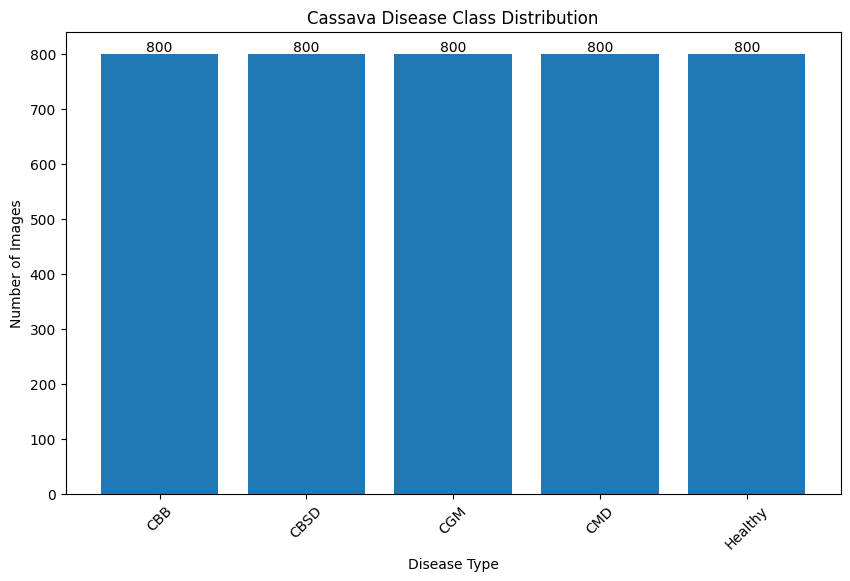

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10,6))

plt.bar(names, values)

plt.title("Cassava Disease Class Distribution")
plt.xlabel("Disease Type")
plt.ylabel("Number of Images")

plt.xticks(rotation=45)

# Add values on top
for i, v in enumerate(values):
    plt.text(i, v + 5, str(v), ha='center')

plt.show()

#Function to Access the single images

In [ ]:
print(train_df["Labels"].unique())
print(train_df["Labels"].dtype)

[3 0 2 4 1]
int64


In [ ]:
import matplotlib.pyplot as plt
from PIL import Image
import os

def show_one_image(class_id):
    row = train_df[train_df["Labels"] == class_id].iloc[0]

    img_path = os.path.join(TRAIN_DIR, row["ID"])
    img = Image.open(img_path)

    plt.imshow(img)
    plt.title(label_map[str(class_id)])
    plt.axis("off")
    plt.show()

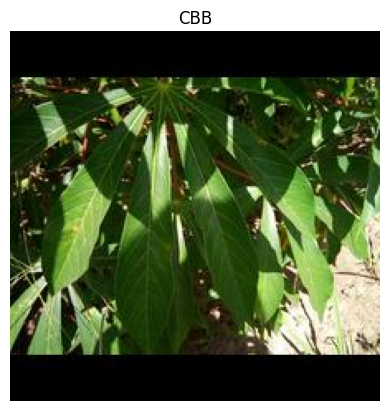

In [ ]:
show_one_image(0)   # change class id

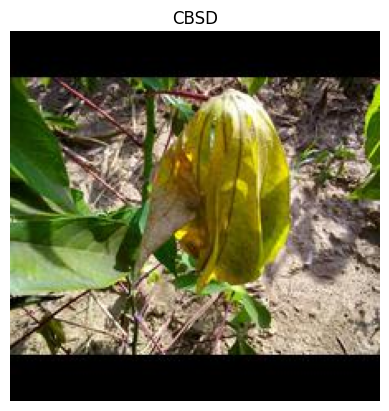

In [ ]:
show_one_image(1)   # change class id

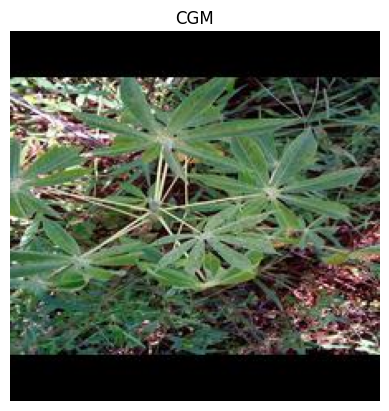

In [ ]:
show_one_image(2)   # change class id

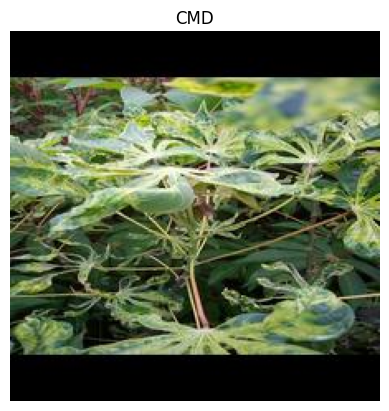

In [ ]:
show_one_image(3)   # change class id

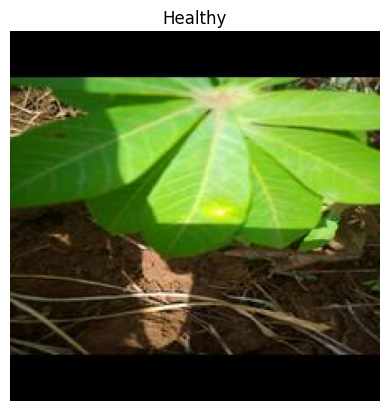

In [ ]:
show_one_image(4)   # change class id

#Function to Access 3 random images from EACH class

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image
import os

def show_random_images_per_class(n=3):
    classes = sorted(train_df["Labels"].unique())

    plt.figure(figsize=(15, len(classes) * 3))

    for i, class_id in enumerate(classes):
        rows = train_df[train_df["Labels"] == class_id].sample(n)

        for j, (_, row) in enumerate(rows.iterrows()):
            img_path = os.path.join(TRAIN_DIR, row["ID"])
            img = Image.open(img_path)

            plt.subplot(len(classes), n, i*n + j + 1)
            plt.imshow(img)
            plt.title(label_map[str(class_id)])
            plt.axis("off")

    plt.tight_layout()
    plt.show()

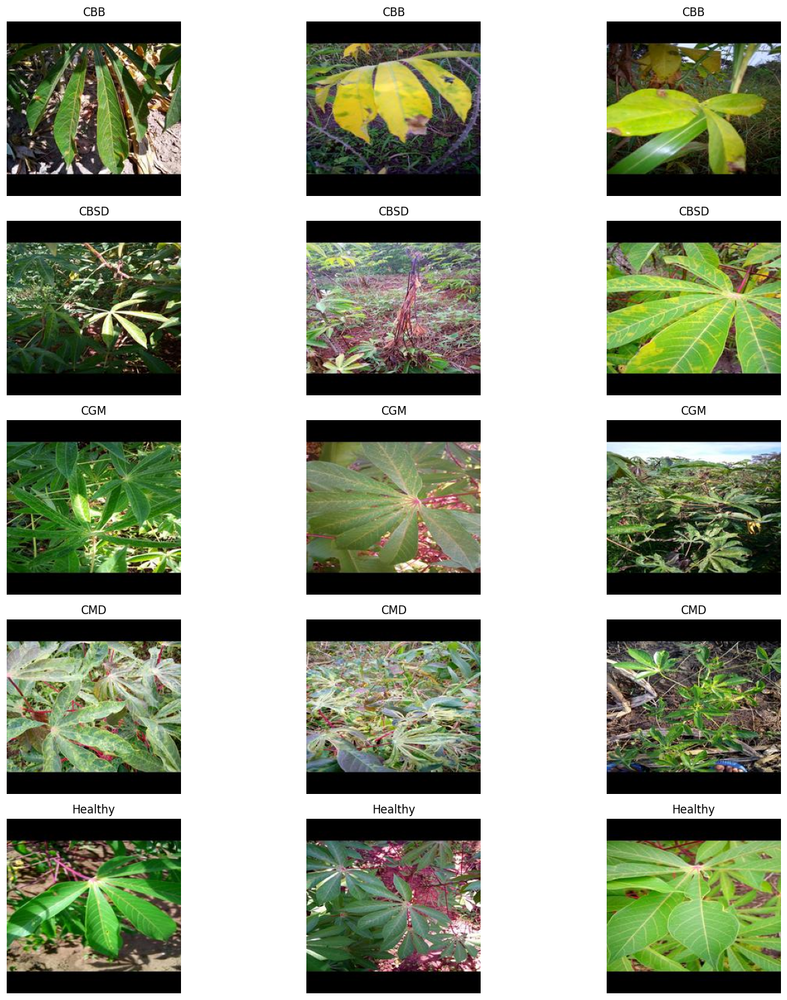

In [ ]:
show_random_images_per_class(n=3)

#Image preprocessing

In [ ]:
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

#Applying image preprocessing on CMD Disease of first image

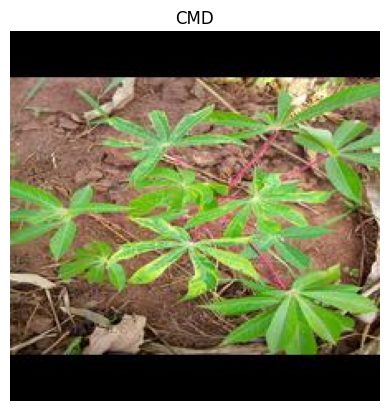

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image
import os

# get one row
row = train_df.iloc[3]

# image path
image_path = os.path.join(TRAIN_DIR, row["ID"])

# label
label_id = row["Labels"]
label_name = label_map[str(label_id)]

# load image
img = Image.open(image_path)

# show image with ONLY class name
plt.imshow(img)
plt.title(label_name)
plt.axis("off")
plt.show()

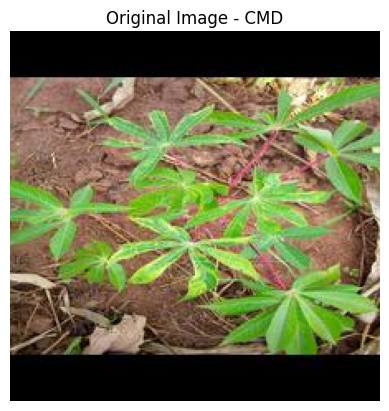

In [ ]:
import cv2
import matplotlib.pyplot as plt

img = cv2.imread(image_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

plt.imshow(img)
plt.title(f"Original Image - {label_name}")
plt.axis("off")
plt.show()

Resize Image

In [ ]:
def show_image(title, image, cmap=None):
    plt.figure(figsize=(5,5))
    plt.imshow(image, cmap=cmap)
    plt.title(title)
    plt.axis("off")
    plt.show()

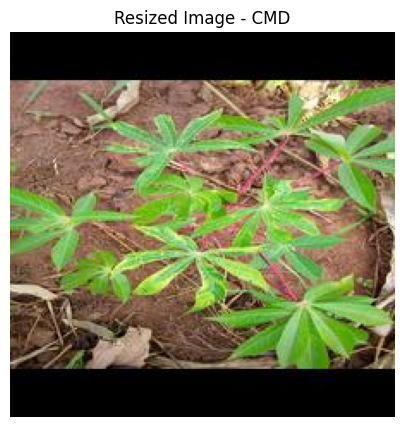

In [ ]:
resized = cv2.resize(img, (224, 224))
show_image(f"Resized Image - {label_name}", resized)

Grayscale

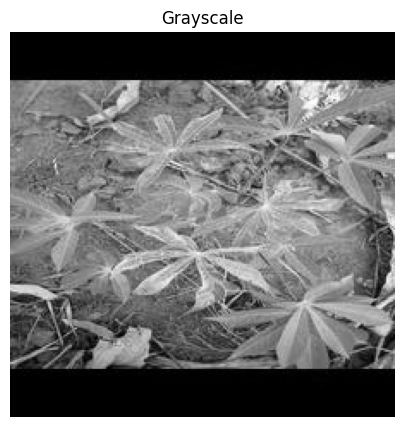

In [ ]:
gray = cv2.cvtColor(resized, cv2.COLOR_RGB2GRAY)
show_image("Grayscale", gray, cmap="gray")



Gaussian BLur

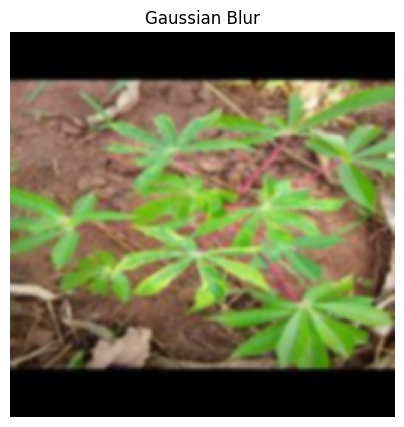

In [ ]:
gaussian_blur = cv2.GaussianBlur(resized, (5, 5), 0)
show_image("Gaussian Blur", gaussian_blur)

Median Blur

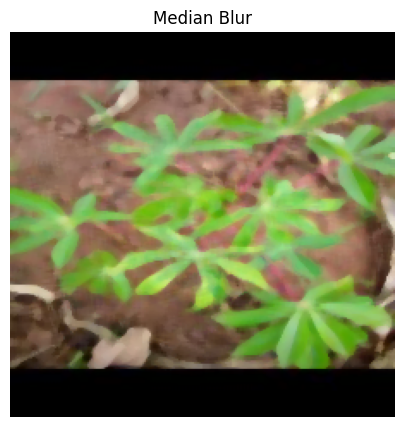

In [ ]:
median_blur = cv2.medianBlur(resized, 5)
show_image("Median Blur", median_blur)

Sharpening

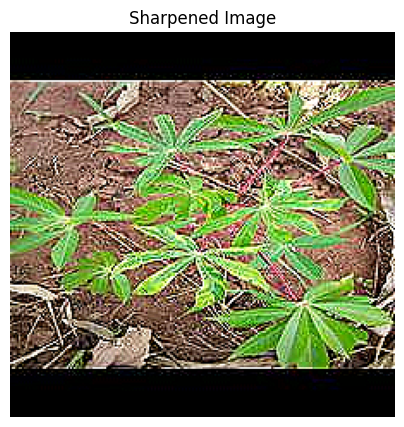

In [ ]:
sharpen_kernel = np.array([
    [0, -1, 0],
    [-1, 5, -1],
    [0, -1, 0]
])

sharpened = cv2.filter2D(resized, -1, sharpen_kernel)
show_image("Sharpened Image", sharpened)

Histogram Equilization

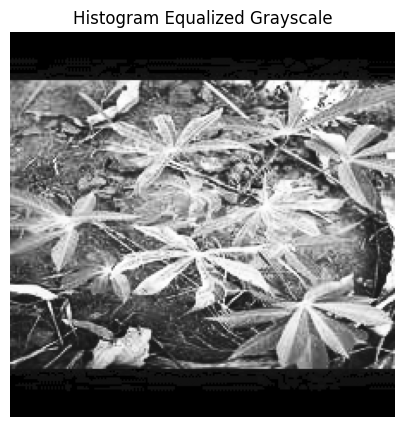

In [ ]:
gray_equalized = cv2.equalizeHist(gray)
show_image("Histogram Equalized Grayscale", gray_equalized, cmap="gray")

CLAHE enhancement

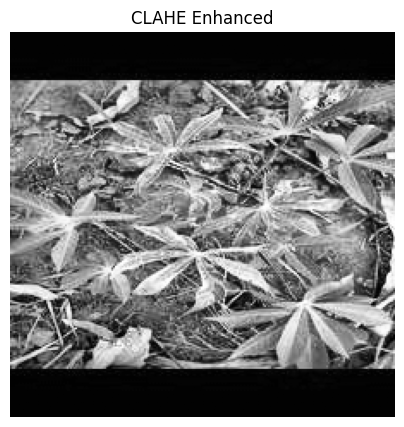

In [ ]:
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
clahe_img = clahe.apply(gray)

show_image("CLAHE Enhanced", clahe_img, cmap="gray")

Canny edge detection

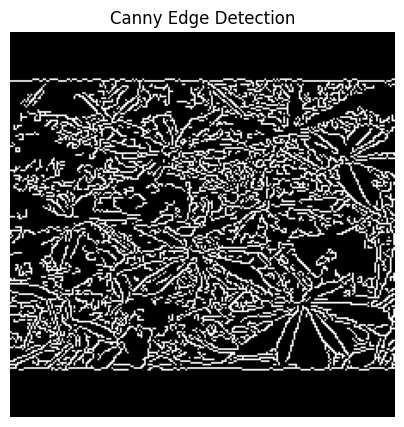

In [ ]:
edges = cv2.Canny(gray, 100, 200)
show_image("Canny Edge Detection", edges, cmap="gray")

Sobel edge detection

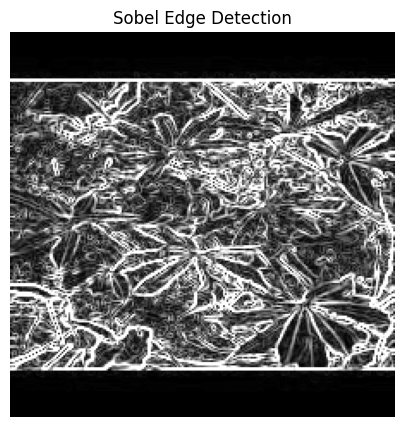

In [ ]:
sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)

sobel = cv2.magnitude(sobel_x, sobel_y)
sobel = np.uint8(np.clip(sobel, 0, 255))

show_image("Sobel Edge Detection", sobel, cmap="gray")




Thresholding

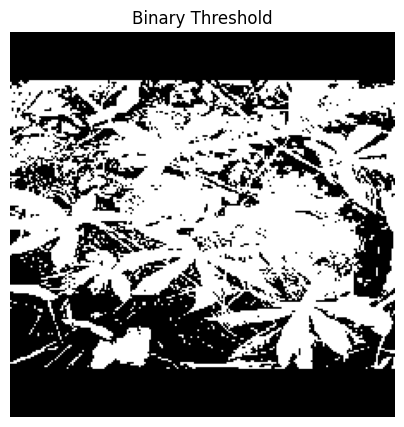

In [ ]:
_, threshold = cv2.threshold(gray, 120, 255, cv2.THRESH_BINARY)
show_image("Binary Threshold", threshold, cmap="gray")

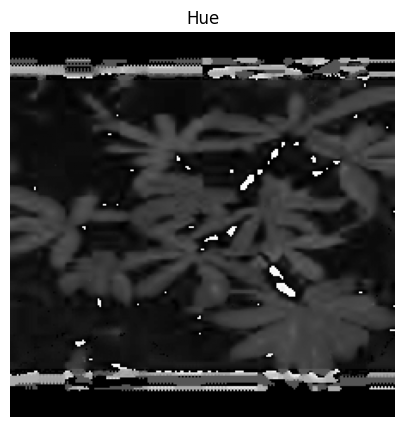

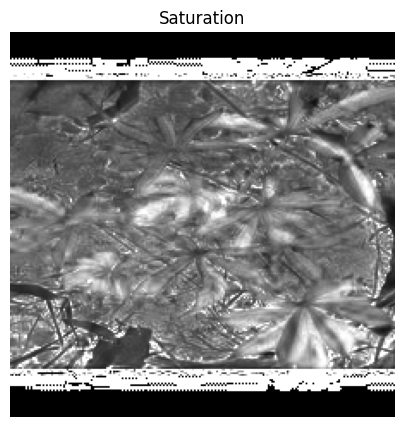

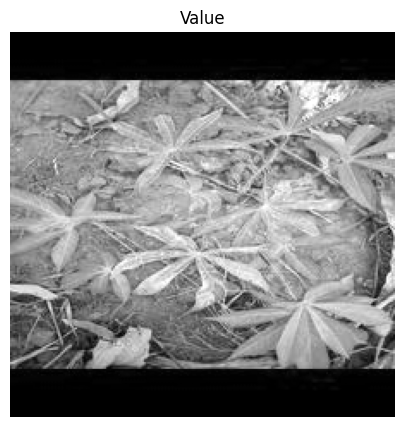

In [ ]:
hsv = cv2.cvtColor(resized, cv2.COLOR_RGB2HSV)
h, s, v = cv2.split(hsv)

show_image("Hue", h, "gray")
show_image("Saturation", s, "gray")
show_image("Value", v, "gray")

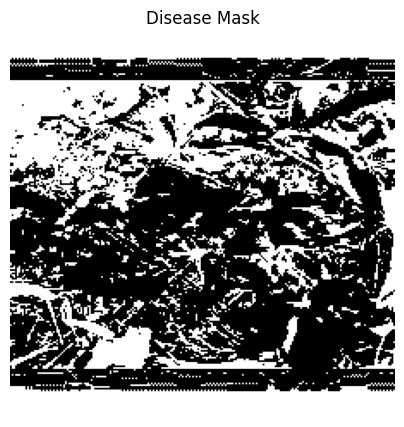

In [ ]:
_, mask = cv2.threshold(s, 100, 255, cv2.THRESH_BINARY_INV)
show_image("Disease Mask", mask, "gray")

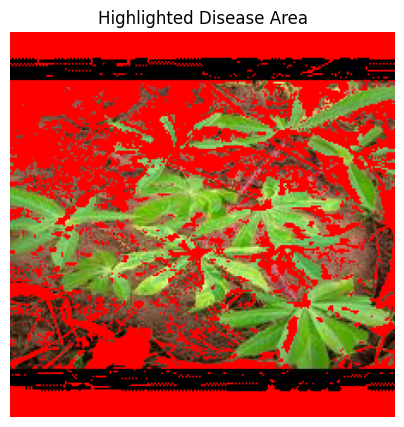

In [ ]:
highlight = resized.copy()
highlight[mask == 255] = [255, 0, 0]

show_image("Highlighted Disease Area", highlight)

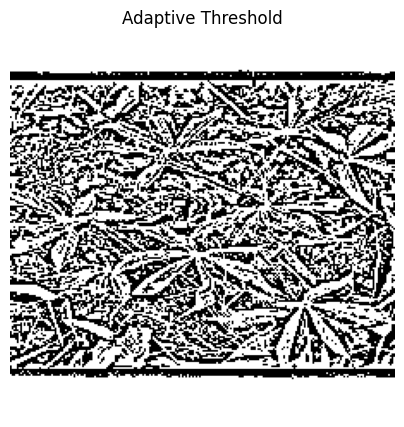

In [ ]:
adaptive_threshold = cv2.adaptiveThreshold(
    gray,
    255,
    cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
    cv2.THRESH_BINARY,
    11,
    2
)

show_image("Adaptive Threshold", adaptive_threshold, cmap="gray")

Morphological operations

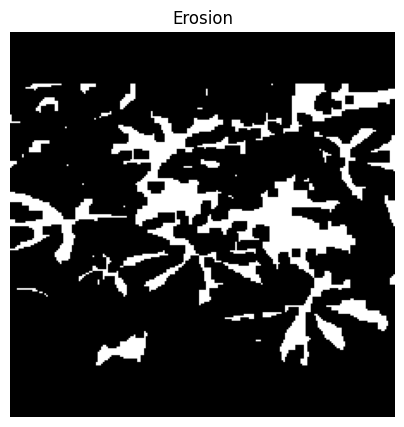

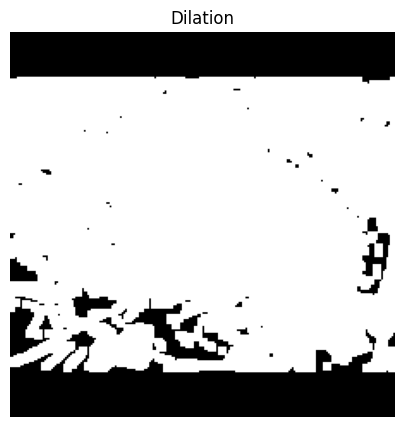

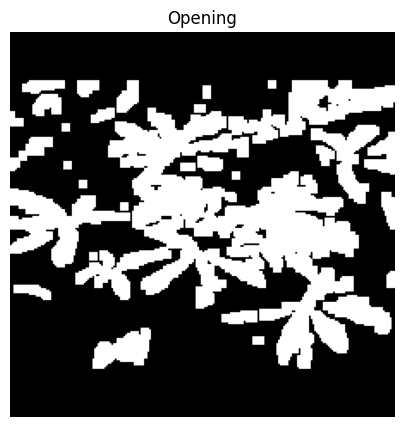

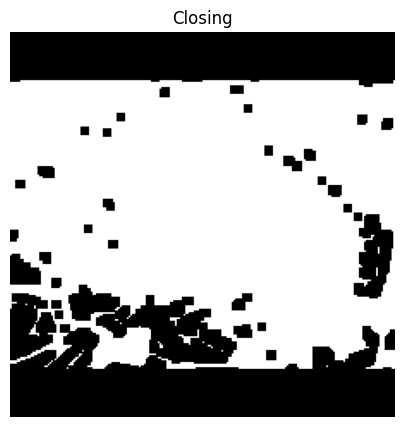

In [ ]:
kernel = np.ones((5,5), np.uint8)

erosion = cv2.erode(threshold, kernel, iterations=1)
dilation = cv2.dilate(threshold, kernel, iterations=1)
opening = cv2.morphologyEx(threshold, cv2.MORPH_OPEN, kernel)
closing = cv2.morphologyEx(threshold, cv2.MORPH_CLOSE, kernel)

show_image("Erosion", erosion, cmap="gray")
show_image("Dilation", dilation, cmap="gray")
show_image("Opening", opening, cmap="gray")
show_image("Closing", closing, cmap="gray")

HSV color space

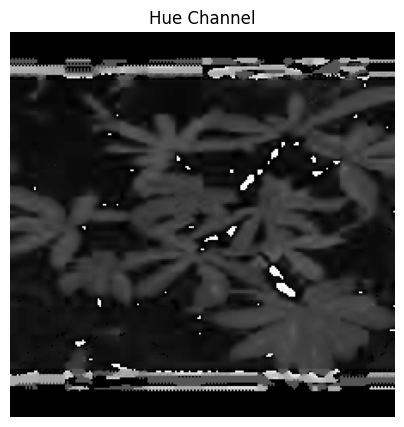

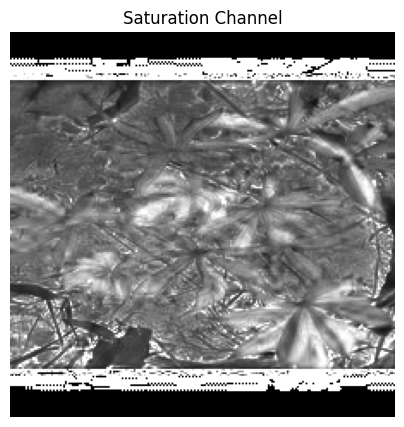

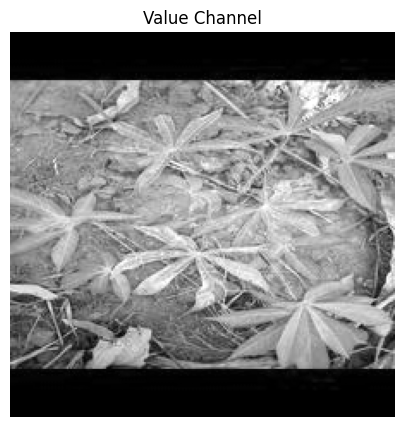

In [ ]:
hsv = cv2.cvtColor(resized, cv2.COLOR_RGB2HSV)

h, s, v = cv2.split(hsv)

show_image("Hue Channel", h, cmap="gray")
show_image("Saturation Channel", s, cmap="gray")
show_image("Value Channel", v, cmap="gray")

RGB histogram

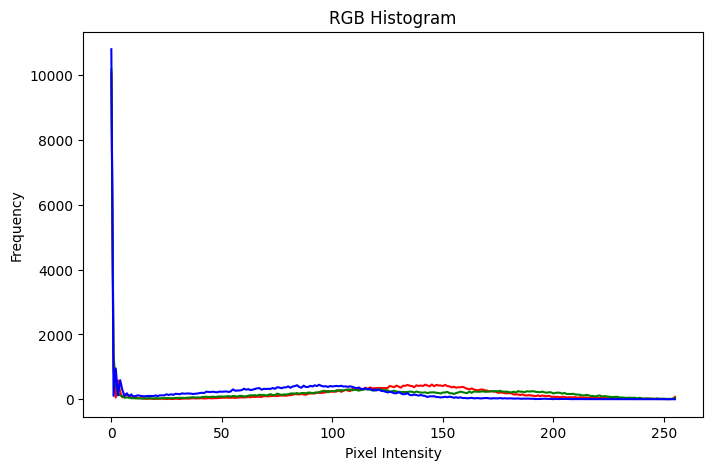

In [ ]:
colors = ("red", "green", "blue")

plt.figure(figsize=(8,5))

for i, color in enumerate(colors):
    hist = cv2.calcHist([resized], [i], None, [256], [0,256])
    plt.plot(hist, color=color)

plt.title("RGB Histogram")
plt.xlabel("Pixel Intensity")
plt.ylabel("Frequency")
plt.show()

Show everything in one grid

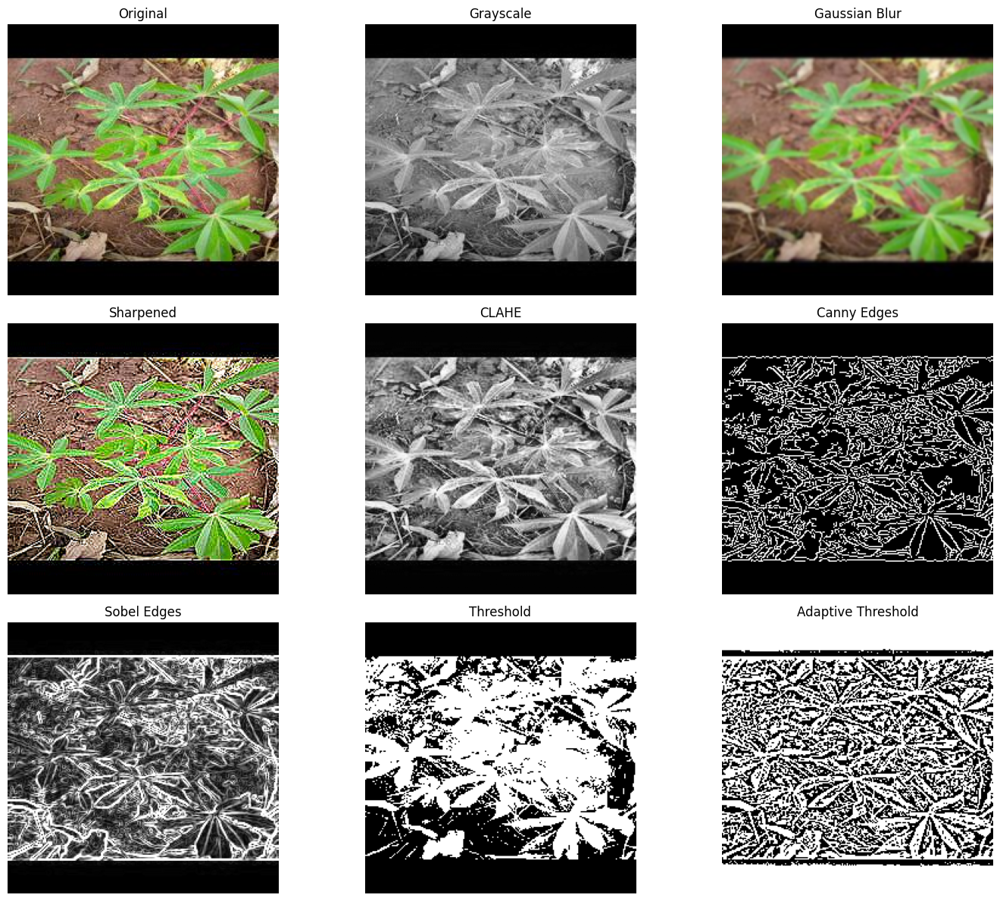

In [ ]:
images = [
    ("Original", resized, None),
    ("Grayscale", gray, "gray"),
    ("Gaussian Blur", gaussian_blur, None),
    ("Sharpened", sharpened, None),
    ("CLAHE", clahe_img, "gray"),
    ("Canny Edges", edges, "gray"),
    ("Sobel Edges", sobel, "gray"),
    ("Threshold", threshold, "gray"),
    ("Adaptive Threshold", adaptive_threshold, "gray")
]

plt.figure(figsize=(15, 12))

for i, (title, image, cmap) in enumerate(images):
    plt.subplot(3, 3, i + 1)
    plt.imshow(image, cmap=cmap)
    plt.title(title)
    plt.axis("off")

plt.tight_layout()
plt.show()

#Image Generator

In [ ]:
# Removed !pip install keras-shufflenet-v2 as it seems unavailable or problematic

In [ ]:
import pandas as pd

train_csv_path = '/content/drive/MyDrive/dataset_sir/main_dataset/Train/Train.csv'
train_df = pd.read_csv(train_csv_path)

print(train_df.head())

               ID  Labels
0  1758913732.jpg       3
1  1241243048.jpg       0
2  3761100385.jpg       2
3  3055614106.jpg       3
4  2386589588.jpg       4


In [ ]:
train_df['Labels'] = train_df['Labels'].astype(str)

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_datagen = ImageDataGenerator(rescale=1./255)

In [ ]:
train_data = train_datagen.flow_from_dataframe(
    dataframe=train_df,
    directory='/content/drive/MyDrive/dataset_sir/main_dataset/Train/Train_Images',
    x_col='ID',
    y_col='Labels',
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical'
)

Found 4000 validated image filenames belonging to 5 classes.


In [ ]:
print("Classes:", train_data.class_indices)
print("Num classes:", len(train_data.class_indices))

Classes: {'0': 0, '1': 1, '2': 2, '3': 3, '4': 4}
Num classes: 5


In [ ]:
import json

map_path = '/content/drive/MyDrive/dataset_sir/main_dataset/label_num_to_disease_map.json'

with open(map_path) as f:
    label_map = json.load(f)

print(label_map)

{'0': 'CBB', '1': 'CBSD', '2': 'CGM', '3': 'CMD', '4': 'Healthy'}


In [ ]:
train_df['Labels'] = train_df['Labels'].astype(str)
train_df['label_name'] = train_df['Labels'].map(label_map)

In [ ]:
train_data = train_datagen.flow_from_dataframe(
    dataframe=train_df,
    directory='/content/drive/MyDrive/dataset_sir/main_dataset/Train/Train_Images',
    x_col='ID',
    y_col='label_name',   # 👈 IMPORTANT CHANGE
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical'
)

Found 4000 validated image filenames belonging to 5 classes.


In [ ]:
print(train_data.class_indices)

{'CBB': 0, 'CBSD': 1, 'CGM': 2, 'CMD': 3, 'Healthy': 4}


#Test Data

In [ ]:
test_df['ID'] = test_df['ID'].astype(str)
test_df['Labels'] = test_df['Labels'].astype(str)

In [ ]:
print(test_df.columns)

Index(['ID', 'Labels'], dtype='object')


In [ ]:
test_dir = '/content/drive/MyDrive/dataset_sir/main_dataset/Test/Test_images'

In [ ]:
import os
print(os.listdir('/content/drive/MyDrive/dataset_sir/main_dataset/Test'))

['Test.csv', 'Test_images']


In [ ]:
import pandas as pd

test_csv_path = '/content/drive/MyDrive/dataset_sir/main_dataset/Test/Test.csv'
test_df = pd.read_csv(test_csv_path)

print(test_df.head())

               ID  Labels
0  2595356168.jpg       3
1   794817264.jpg       0
2  4270972443.jpg       4
3  3540803278.jpg       0
4  2142522228.jpg       3


In [ ]:
test_df['Labels'] = test_df['Labels'].astype(str)

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

test_datagen = ImageDataGenerator(rescale=1./255)

test_data = test_datagen.flow_from_dataframe(
    dataframe=test_df,
    directory=test_dir,   # ✅ fixed
    x_col='ID',
    y_col='Labels',
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    shuffle=False
)

Found 1000 validated image filenames belonging to 5 classes.


### Build the Model (using MobileNetV3Small as a lightweight base similar to ShuffleNet)

In [ ]:
import tensorflow as tf
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau

IMG_SIZE = (224, 224)
NUM_CLASSES = len(train_data.class_indices)

# 🔹 Load pretrained model
base_model = MobileNetV2(
    weights='imagenet',
    include_top=False,
    input_shape=(224, 224, 3)
)

# Freeze base model (important for transfer learning)
for layer in base_model.layers:
    layer.trainable = False

# 🔹 Custom head
x = base_model.output
x = GlobalAveragePooling2D()(x)

x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)

x = Dense(128, activation='relu')(x)
x = Dropout(0.3)(x)

output = Dense(NUM_CLASSES, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=output)

In [ ]:
early_stop = EarlyStopping(
    monitor='val_loss',
    patience=3,              # stop if no improvement for 3 epochs
    restore_best_weights=True
)

checkpoint = ModelCheckpoint(
    'best_model.keras',      # save best model
    monitor='val_loss',
    save_best_only=True,
    verbose=1
)

reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.3,              # reduce LR by 70%
    patience=2,
    min_lr=1e-6,
    verbose=1
)

In [ ]:
model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

In [ ]:
history = model.fit(
    train_data,
    epochs=20,
    validation_data=test_data,
    callbacks=[early_stop, checkpoint, reduce_lr],
    verbose=1   # shows batch progress
)

Epoch 1/20
125/125 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step - accuracy: 0.3053 - loss: 1.6572
Epoch 1: val_loss improved from None to 1.29211, saving model to best_model.keras

Epoch 1: finished saving model to best_model.keras
125/125 ━━━━━━━━━━━━━━━━━━━━ 59s 322ms/step - accuracy: 0.3510 - loss: 1.5052 - val_accuracy: 0.4780 - val_loss: 1.2921 - learning_rate: 0.0010
Epoch 2/20
125/125 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - accuracy: 0.4520 - loss: 1.3337
Epoch 2: val_loss improved from 1.29211 to 1.20639, saving model to best_model.keras

Epoch 2: finished saving model to best_model.keras
125/125 ━━━━━━━━━━━━━━━━━━━━ 22s 175ms/step - accuracy: 0.4575 - loss: 1.3150 - val_accuracy: 0.5190 - val_loss: 1.2064 - learning_rate: 0.0010
Epoch 3/20
125/125 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - accuracy: 0.4686 - loss: 1.2573
Epoch 3: val_loss improved from 1.20639 to 1.18060, saving model to best_model.keras

Epoch 3: finished saving model to best_model.keras
125/125 ━━━━━━━━━━━━━━━━━━━━ 21s 165ms/s

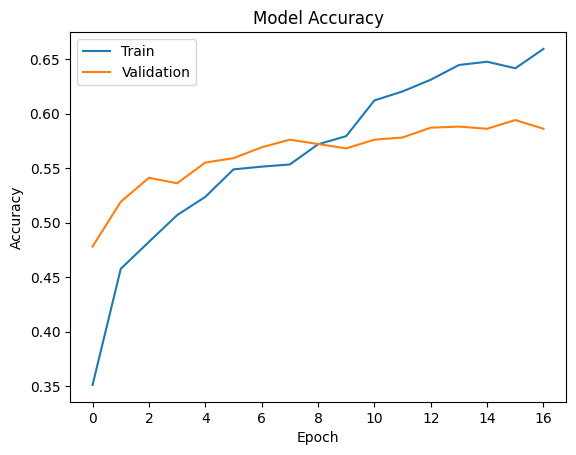

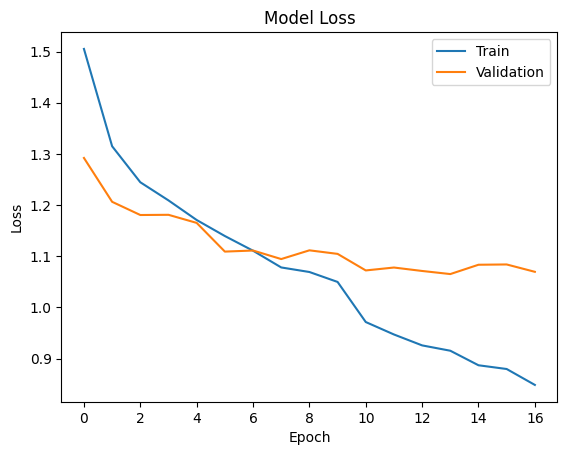

In [ ]:
import matplotlib.pyplot as plt

# Accuracy
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Validation'])
plt.show()

# Loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'])
plt.show()

In [ ]:
loss, acc = model.evaluate(test_data)
print("Test Accuracy:", acc)

32/32 ━━━━━━━━━━━━━━━━━━━━ 6s 170ms/step - accuracy: 0.5880 - loss: 1.0652
Test Accuracy: 0.5879999995231628


In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np

y_true = test_data.classes
y_pred = model.predict(test_data)
y_pred = np.argmax(y_pred, axis=1)

print(confusion_matrix(y_true, y_pred))
print(classification_report(y_true, y_pred))

32/32 ━━━━━━━━━━━━━━━━━━━━ 14s 298ms/step
[[133  22   5   8  32]
 [ 36  97  16  12  39]
 [ 10  15 103  39  33]
 [  6   6  39 137  12]
 [ 40  18  15   9 118]]
              precision    recall  f1-score   support

           0       0.59      0.67      0.63       200
           1       0.61      0.48      0.54       200
           2       0.58      0.52      0.54       200
           3       0.67      0.69      0.68       200
           4       0.50      0.59      0.54       200

    accuracy                           0.59      1000
   macro avg       0.59      0.59      0.59      1000
weighted avg       0.59      0.59      0.59      1000



### 🎯 1. Predict on a SINGLE image

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

# Load class names
class_names = list(train_data.class_indices.keys())

def predict_single_image(img_path, model):
    # Load image
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Resize
    img_resized = cv2.resize(img, (224, 224))

    # Normalize
    img_norm = img_resized / 255.0

    # Expand dims
    img_input = np.expand_dims(img_norm, axis=0)

    # Predict
    pred = model.predict(img_input)
    pred_class = np.argmax(pred)
    confidence = np.max(pred)

    # Show result
    plt.imshow(img)
    plt.title(f"Predicted: {class_names[pred_class]} ({confidence:.2f})")
    plt.axis('off')
    plt.show()

    return class_names[pred_class], confidence

In [ ]:
import os
print(os.path.exists(img_path))

True


In [ ]:
import os

test_folder = '/content/drive/MyDrive/dataset_sir/main_dataset/Test/Test_images'
print(os.listdir(test_folder)[:10])

['1004826518.jpg', '1012257169.jpg', '1012426959.jpg', '101253257.jpg', '1014492188.jpg', '1021655183.jpg', '1021758544.jpg', '1023663951.jpg', '1024191493.jpg', '1032629824.jpg']


In [ ]:
def predict_single_image(img_path, model):
    import cv2
    import numpy as np
    import matplotlib.pyplot as plt

    # Check file exists
    import os
    if not os.path.exists(img_path):
        print("❌ File not found:", img_path)
        return

    # Load image
    img = cv2.imread(img_path)

    if img is None:
        print("❌ Failed to load image (corrupted or wrong format)")
        return

    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    img_resized = cv2.resize(img, (224, 224))
    img_norm = img_resized / 255.0
    img_input = np.expand_dims(img_norm, axis=0)

    pred = model.predict(img_input)
    pred_class = np.argmax(pred)
    confidence = np.max(pred)

    plt.imshow(img)
    plt.title(f"Predicted: {class_names[pred_class]} ({confidence:.2f})")
    plt.axis('off')
    plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


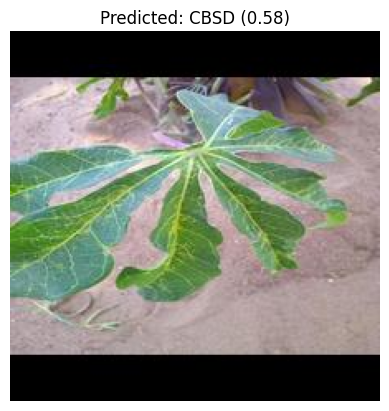

In [ ]:
import os

test_folder = '/content/drive/MyDrive/dataset_sir/main_dataset/Test/Test_images'
img_name = os.listdir(test_folder)[0]

img_path = os.path.join(test_folder, img_name)

predict_single_image(img_path, model)

#🔥 2. Predict on MULTIPLE images

In [ ]:
class_names = list(train_data.class_indices.keys())

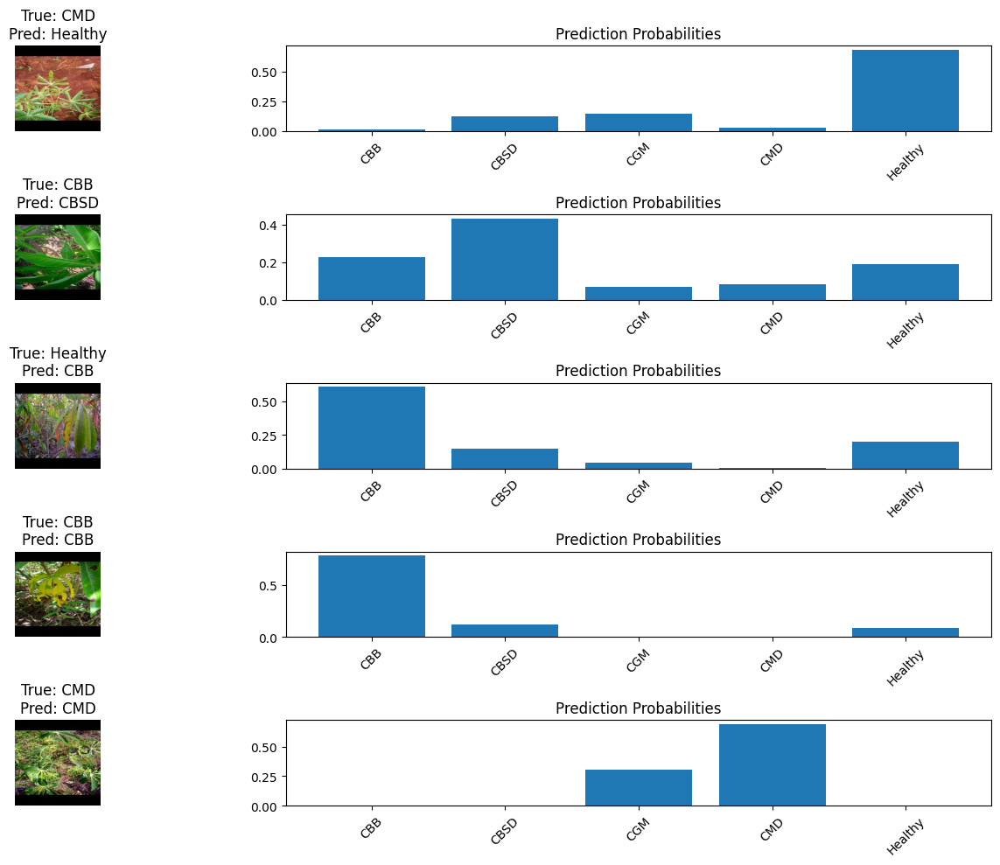

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

test_folder = '/content/drive/MyDrive/dataset_sir/main_dataset/Test/Test_images'

# get filenames + true labels from generator
filenames = test_data.filenames
true_labels = test_data.classes

# number of images to display
num_images = 5

plt.figure(figsize=(15, 10))

for i in range(num_images):
    img_name = filenames[i]
    img_path = os.path.join(test_folder, img_name)

    # Load image
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Preprocess
    img_resized = cv2.resize(img, (224, 224))
    img_norm = img_resized / 255.0
    img_input = np.expand_dims(img_norm, axis=0)

    # Predict
    preds = model.predict(img_input, verbose=0)[0]
    pred_class = np.argmax(preds)

    # ---- IMAGE ----
    plt.subplot(num_images, 2, 2*i+1)
    plt.imshow(img)
    plt.title(f"True: {class_names[true_labels[i]]}\nPred: {class_names[pred_class]}")
    plt.axis('off')

    # ---- BAR CHART ----
    plt.subplot(num_images, 2, 2*i+2)
    plt.bar(class_names, preds)
    plt.title("Prediction Probabilities")
    plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

#🎯 Top-3 predictions visualization

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

class_names = list(train_data.class_indices.keys())

def predict_top3(img_path, model):
    # Load image
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Preprocess
    img_resized = cv2.resize(img, (224, 224))
    img_norm = img_resized / 255.0
    img_input = np.expand_dims(img_norm, axis=0)

    # Predict
    preds = model.predict(img_input, verbose=0)[0]

    # Top 3 indices
    top3_idx = preds.argsort()[-3:][::-1]

    # ---- Display ----
    plt.figure(figsize=(10,4))

    # Image
    plt.subplot(1,2,1)
    plt.imshow(img)
    plt.title("Input Image")
    plt.axis('off')

    # Bar chart
    plt.subplot(1,2,2)
    top3_labels = [class_names[i] for i in top3_idx]
    top3_probs = preds[top3_idx]

    plt.bar(top3_labels, top3_probs)
    plt.title("Top-3 Predictions")
    plt.ylim(0,1)

    for i, v in enumerate(top3_probs):
        plt.text(i, v + 0.02, f"{v:.2f}", ha='center')

    plt.show()

    return list(zip(top3_labels, top3_probs))

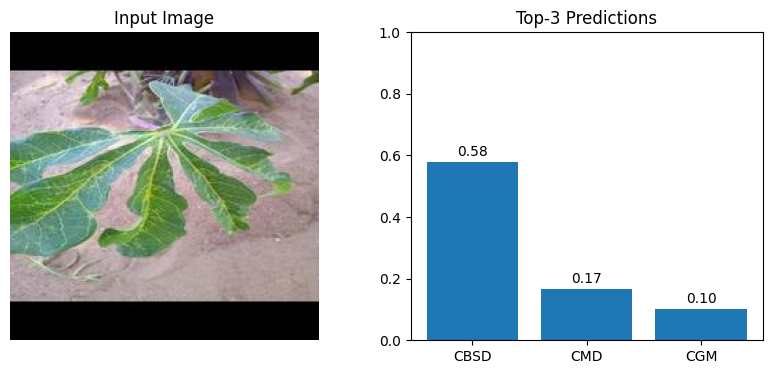

[('CBSD', np.float32(0.5778192)),
 ('CMD', np.float32(0.16759442)),
 ('CGM', np.float32(0.10156855))]

In [ ]:
import os

test_folder = '/content/drive/MyDrive/dataset_sir/main_dataset/Test/Test_images'
img_name = os.listdir(test_folder)[0]

img_path = os.path.join(test_folder, img_name)

predict_top3(img_path, model)

Image: 1004826518.jpg


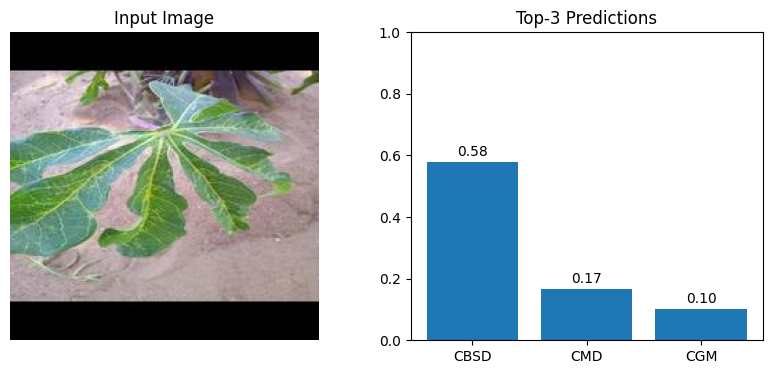

[('CBSD', np.float32(0.5778192)), ('CMD', np.float32(0.16759442)), ('CGM', np.float32(0.10156855))]
----------------------------------------
Image: 1012257169.jpg


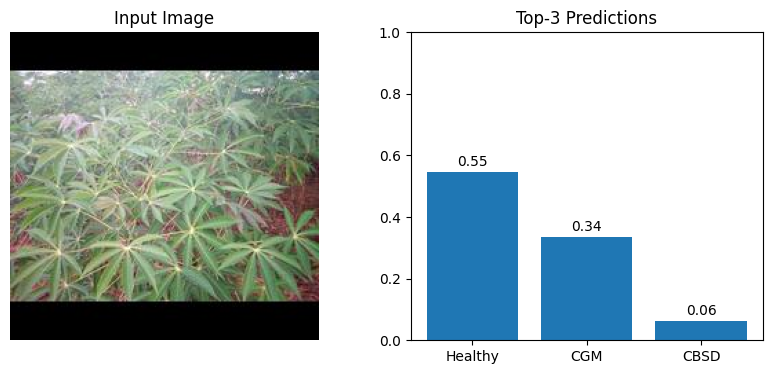

[('Healthy', np.float32(0.54565865)), ('CGM', np.float32(0.33658373)), ('CBSD', np.float32(0.06139532))]
----------------------------------------
Image: 1012426959.jpg


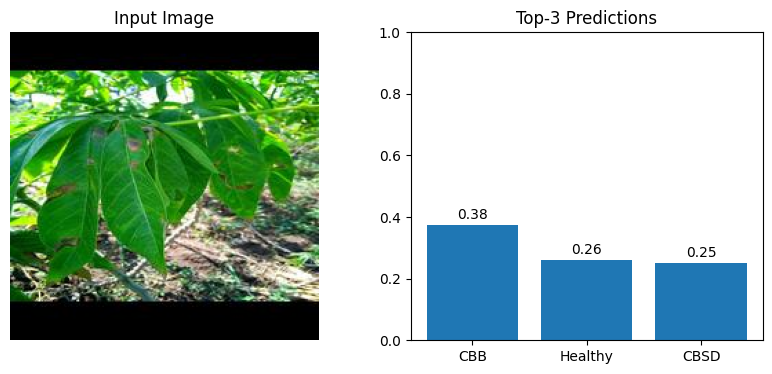

[('CBB', np.float32(0.375273)), ('Healthy', np.float32(0.26137)), ('CBSD', np.float32(0.25012365))]
----------------------------------------
Image: 101253257.jpg


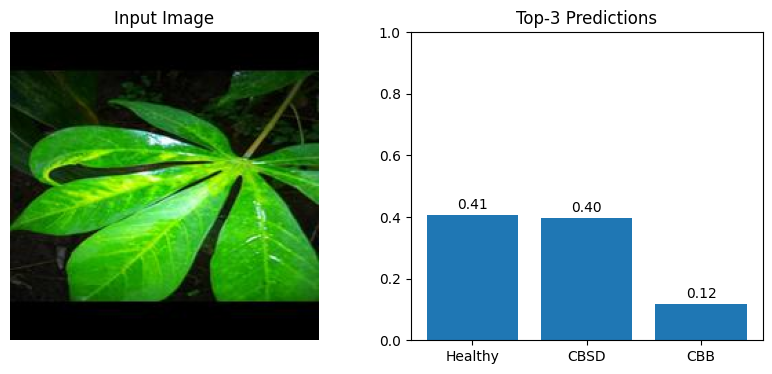

[('Healthy', np.float32(0.40521654)), ('CBSD', np.float32(0.39569676)), ('CBB', np.float32(0.11805825))]
----------------------------------------
Image: 1014492188.jpg


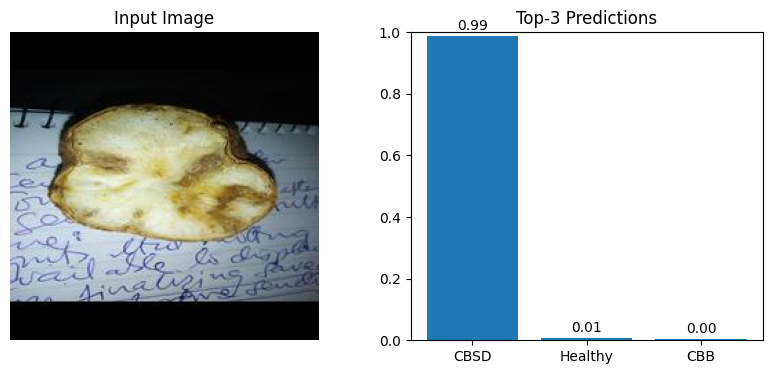

[('CBSD', np.float32(0.98800987)), ('Healthy', np.float32(0.0063957036)), ('CBB', np.float32(0.0046990495))]
----------------------------------------


In [ ]:
import os

test_folder = '/content/drive/MyDrive/dataset_sir/main_dataset/Test/Test_images'

for img_name in os.listdir(test_folder)[:5]:
    img_path = os.path.join(test_folder, img_name)
    print("Image:", img_name)
    print(predict_top3(img_path, model))
    print("-"*40)

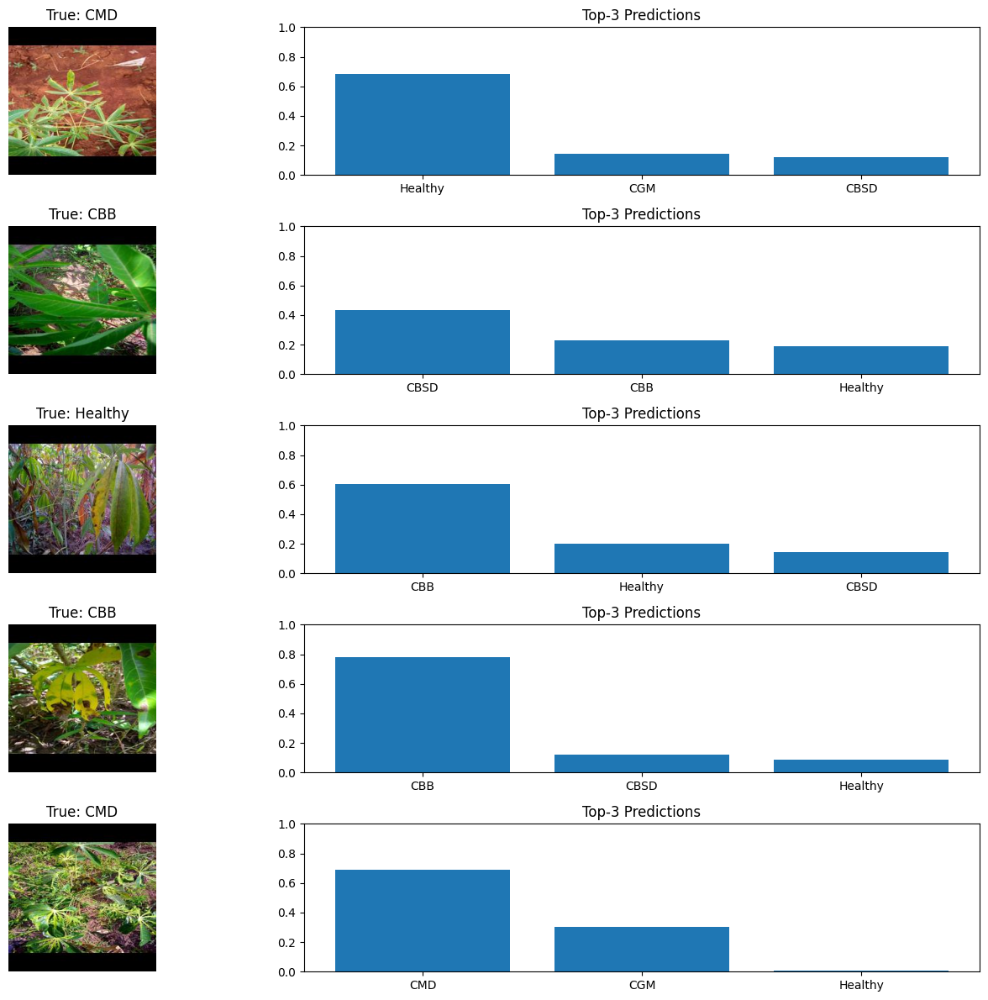

In [ ]:
import matplotlib.pyplot as plt

filenames = test_data.filenames
true_labels = test_data.classes

plt.figure(figsize=(15, 12))

for i in range(5):
    img_path = os.path.join(test_folder, filenames[i])

    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    img_resized = cv2.resize(img, (224, 224)) / 255.0
    img_input = np.expand_dims(img_resized, axis=0)

    preds = model.predict(img_input, verbose=0)[0]

    top3_idx = preds.argsort()[-3:][::-1]

    # Image
    plt.subplot(5, 2, 2*i+1)
    plt.imshow(img)
    plt.title(f"True: {class_names[true_labels[i]]}")
    plt.axis('off')

    # Top-3 bar
    plt.subplot(5, 2, 2*i+2)
    labels = [class_names[j] for j in top3_idx]
    probs = preds[top3_idx]

    plt.bar(labels, probs)
    plt.title("Top-3 Predictions")
    plt.ylim(0,1)

plt.tight_layout()
plt.show()

In [ ]:
wrong_idx = np.where(np.argmax(model.predict(test_data), axis=1) != true_labels)[0]

for i in wrong_idx[:5]:
    print("Index:", i)

32/32 ━━━━━━━━━━━━━━━━━━━━ 5s 152ms/step
Index: 0
Index: 1
Index: 2
Index: 5
Index: 9


#📊 1. Confusion Matrix Heatmap (clean + visual)

32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step


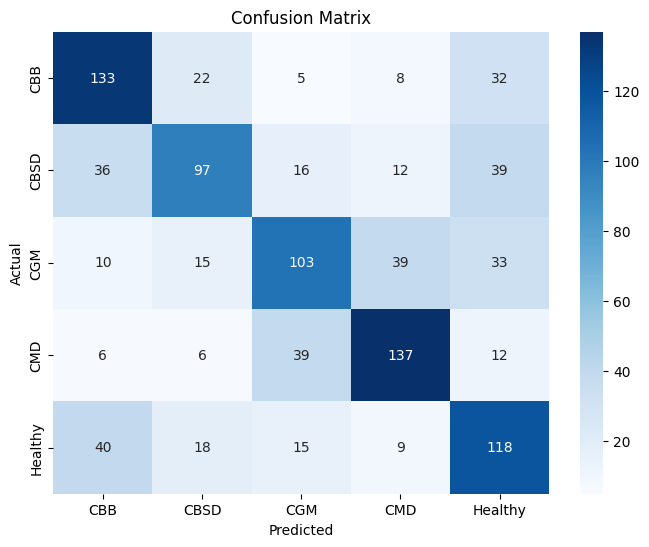

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Predictions
y_pred = model.predict(test_data)
y_pred_classes = np.argmax(y_pred, axis=1)

# True labels
y_true = test_data.classes

# Class names
class_names = list(train_data.class_indices.keys())

# Confusion matrix
cm = confusion_matrix(y_true, y_pred_classes)

# Plot
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names,
            yticklabels=class_names)

plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

In [ ]:
import os
import cv2

# Get filenames
filenames = test_data.filenames

# Find wrong predictions
wrong_idx = np.where(y_pred_classes != y_true)[0]

print("Total misclassified:", len(wrong_idx))

Total misclassified: 412


#Classification Report (F1, Precision, Recall)

In [ ]:
from sklearn.metrics import classification_report
import numpy as np

# Predictions
y_pred = model.predict(test_data)
y_pred_classes = np.argmax(y_pred, axis=1)

# True labels
y_true = test_data.classes

# Class names
class_names = list(train_data.class_indices.keys())

# Report
report = classification_report(y_true, y_pred_classes, target_names=class_names)

print(report)

32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 118ms/step
              precision    recall  f1-score   support

         CBB       0.59      0.67      0.63       200
        CBSD       0.61      0.48      0.54       200
         CGM       0.58      0.52      0.54       200
         CMD       0.67      0.69      0.68       200
     Healthy       0.50      0.59      0.54       200

    accuracy                           0.59      1000
   macro avg       0.59      0.59      0.59      1000
weighted avg       0.59      0.59      0.59      1000



In [ ]:
import tensorflow as tf

# Load best model (IMPORTANT)
model.load_weights('best_model.keras')

# Convert
converter = tf.lite.TFLiteConverter.from_keras_model(model)
tflite_model = converter.convert()

# Save file
with open('model.tflite', 'wb') as f:
    f.write(tflite_model)

print("✅ TFLite model saved!")

Saved artifact at '/tmp/tmplc2884b2'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name='keras_tensor')
Output Type:
  TensorSpec(shape=(None, 5), dtype=tf.float32, name=None)
Captures:
  134025672892560: TensorSpec(shape=(), dtype=tf.resource, name=None)
  134025672894288: TensorSpec(shape=(), dtype=tf.resource, name=None)
  134025672896976: TensorSpec(shape=(), dtype=tf.resource, name=None)
  134025672896592: TensorSpec(shape=(), dtype=tf.resource, name=None)
  134025672895440: TensorSpec(shape=(), dtype=tf.resource, name=None)
  134025672897168: TensorSpec(shape=(), dtype=tf.resource, name=None)
  134025672895632: TensorSpec(shape=(), dtype=tf.resource, name=None)
  134025672897744: TensorSpec(shape=(), dtype=tf.resource, name=None)
  134025672897360: TensorSpec(shape=(), dtype=tf.resource, name=None)
  134025672895248: TensorSpec(shape=(), dtype=tf.resource, name=None)
  13402567289390

In [ ]:
converter = tf.lite.TFLiteConverter.from_keras_model(model)

# Optimization
converter.optimizations = [tf.lite.Optimize.DEFAULT]

tflite_model = converter.convert()

with open('model_optimized.tflite', 'wb') as f:
    f.write(tflite_model)

Saved artifact at '/tmp/tmp8o7rknq5'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name='keras_tensor')
Output Type:
  TensorSpec(shape=(None, 5), dtype=tf.float32, name=None)
Captures:
  134025672892560: TensorSpec(shape=(), dtype=tf.resource, name=None)
  134025672894288: TensorSpec(shape=(), dtype=tf.resource, name=None)
  134025672896976: TensorSpec(shape=(), dtype=tf.resource, name=None)
  134025672896592: TensorSpec(shape=(), dtype=tf.resource, name=None)
  134025672895440: TensorSpec(shape=(), dtype=tf.resource, name=None)
  134025672897168: TensorSpec(shape=(), dtype=tf.resource, name=None)
  134025672895632: TensorSpec(shape=(), dtype=tf.resource, name=None)
  134025672897744: TensorSpec(shape=(), dtype=tf.resource, name=None)
  134025672897360: TensorSpec(shape=(), dtype=tf.resource, name=None)
  134025672895248: TensorSpec(shape=(), dtype=tf.resource, name=None)
  13402567289390